# XeF2 1 - 300 eV Bond Scans processing (original bondscan dataset version)

This notebook implements the [same analysis as previously](https://phockett.github.io/ePSdata/XeF2-preliminary/xe-xef2_plots-notes_220421.html), but with bond-length averaging of the results (symmetric stretch only). 

29/07/21

TIDY version - see dev version for more notes.

- Updating with new calcs. (1 eV, all orbs, heavy calc settings) + new methods for previous "bondscan" data (2.5eV, all orbs, larger bond range, original settings.)
- Q: possible to configure output for use in existing code?  Maybe averaged-bond case...?
    - See N2O notebook, http://jake/jupyter/user/paul/lab/tree/ePS/N2O/epsproc/N2O_bondscan_NN_orb1-3_processing_070521-ref.ipynb
    
NOTEs: 

- for "heavy" results set case, limited range of bond lengths means little change in results for sigmaBond>0.1, but do see some general smoothing/broadening of features.


11/05/21

- Messing around with low Eke region and data export.
- Adding code for stacking to dataset and interp + convolutions.
   - Convolutions working OK for subselected data with [scipy.ndimage.gaussian_filter](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.gaussian_filter.html#scipy.ndimage.gaussian_filter) May not be the best method, see also TMO-dev code, used it more carefully there...?
   - 1D interp working OK with [native Xarray functionality (wraps scipy)](http://xarray.pydata.org/en/stable/user-guide/interpolation.html).
   - [Xarray convolution should be possible using rolling operations](https://github.com/pydata/xarray/issues/4196) (v0.17> for ND version), but still somewhat in progress!
   - Code is a total mess, but ran for existing orb21 BS scans and output figs.


23/04/21

- With updated results

09/04/21

- Extended energy range (2.5eV resolution).
- Longer bond lengths (>2.1A) now included (up to 2.4A).


06/04/21
PH

- Just looking at orb21 so far.
- Scanned 1.5 - 3.0 A, symmetric stretch, Gamess/ROHF/SPKrATZP (as per previous calcs). Equilibrium bond is 1.937 A.

Docs:

- Bond scan dev notebook: http://100.86.127.24/jupyter/user/paul/lab/tree/ePS/XeF2_2020/epsman_2021/XeF2_epsman-gamess_tests_310321-incSymTests.ipynb

- Previous processing (at equilibrium bond length, all orbs + expt.): https://phockett.github.io/ePSdata/XeF2-preliminary/XeF2_ePS-expt_comp_271020_4d_v111120-dist.html


Bond scan PES from Gamess results (Hartrees vs. Angs.), run for `bondLengths = np.arange(1.5,3.1,0.05)`
<img src='XeF2-bond-scan_symmetric_E_SPKrATZP-rel_DNH8_010421.png' />

## Setup

In [1]:
!hostname

jake


In [2]:
!conda env list

# conda environments:
#
base                     /home/paul/anaconda3
baseBK-280321            /home/paul/anaconda3/envs/baseBK-280321
ePSproc-v1.2             /home/paul/anaconda3/envs/ePSproc-v1.2
ePSproc-v1.2-dev         /home/paul/anaconda3/envs/ePSproc-v1.2-dev
epsdev                *  /home/paul/anaconda3/envs/epsdev
epsman                   /home/paul/anaconda3/envs/epsman
fibre-sim                /home/paul/anaconda3/envs/fibre-sim
frog                     /home/paul/anaconda3/envs/frog
matlab                   /home/paul/anaconda3/envs/matlab
tmo-dev                  /home/paul/anaconda3/envs/tmo-dev



* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 
* pyevtk not found, VTK export not available. 


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
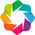

In [3]:
import sys
import os
from pathlib import Path
import numpy as np
# import epsproc as ep
import xarray as xr

import matplotlib.pyplot as plt

from datetime import datetime as dt
timeString = dt.now()

import epsproc as ep

# Plotters
from epsproc.plot import hvPlotters

# Multijob class dev code
from epsproc.classes.multiJob import ePSmultiJob


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
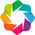

In [170]:
hvPlotters.setPlotters(width = 1000, snsStyle='whitegrid')

# For class, above settings don't take, not sure why, something to do with namespaces/calling sequence?
# Overriding snsStyle does work however... although NOT CONSISTENTLY????
# AH, looks like ordering matters - set_style LAST (.set seems to override)
import seaborn as sns

sns.set(rc={'figure.figsize':(10,6)})  # Set figure size in inches
sns.set_context("paper")
sns.set_style("whitegrid")  # Set plot style
sns.set_palette("Paired")   # Set colour mapping

# Try direct fig type setting for PDF output figs
from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('png', 'pdf')
set_matplotlib_formats('svg', 'pdf')

In [5]:
# xr.set_options(display_style='html')

## Load data

In [6]:
# # Scan for subdirs, based on existing routine in getFiles()

fileBase = Path('/home/paul/ePS/XeF2_2020/XeF2_bondscan')  # Data dir on Jake
# fileBase = Path('/home/paul/ePS/XeF2_2020/XeF2_heavy')  # Data dir on Jake


In [7]:
data = ePSmultiJob(fileBase, verbose = 0)

In [8]:
keys = np.r_[np.arange(0,21+1,3), np.arange(32,32+21+1,3)]
keys

array([ 0,  3,  6,  9, 12, 15, 18, 21, 32, 35, 38, 41, 44, 47, 50, 53])

In [169]:
# # bondLengths = np.arange(1.5,3.1,0.05)
# # keys = np.arange(0,32,4)
# # keys = np.arange(0,12+1,4)  # 1st run, OK to n=12, 2.100A
# # keys = np.arange(2,18+1,4)  # 2nd run, OK to n=18, 2.400A
# # keys = np.arange(0,18+1,4)  # 2nd run, OK to n=18, 2.400A
# # keys = np.arange(0,21+1,3)  # 2nd run, OK to n=18, 2.400A
# keys = np.arange(0,18+1) # For interp testing, load ALL
# # keys = [19,20]

# All orbs case...
orbSet = 32
step = 1
keys = np.r_[np.arange(0,18+1,step), np.arange(orbSet,orbSet+18+1,step), np.arange(2*orbSet,2*orbSet+18+1,step)]

# print(keys)

# [print(n, item) for n,item in enumerate(data.jobs['jobDirs']) if n in keys];


In [10]:
# keys = [4,5,6]  # Set for 4d data only
# data.scanFiles(keys = keys)
data.scanFiles(keys = keys, outputKeyType = 'dir')  # With specified keys
# data.scanFiles(outputKeyType = 'dir')  # All keys
data.jobsSummary()

# # Replace orb labels with bond lengths
# for key in data.data.keys():
#     data.data[key]['jobNotes']['orbLabel'] = key.split('-')[1]

Found 57 directories, with 798 files.

*** Job orb21_A1G-1.500 details
Key: orb21_A1G-1.500
Dir /home/paul/ePS/XeF2_2020/XeF2_bondscan/orb21_A1G-1.500, 14 file(s).
{   'batch': 'ePS XeF2_2020, batch XeF2_bondscan, orbital orb21_A1G-1.500',
    'event': 'orb 21 ionization (Xe 4d, A1G/SG), bond = 1.500 A.',
    'orbE': -76.25174653850758,
    'orbLabel': 'Xe 4d, A1G/SG'}

*** Job orb21_A1G-1.550 details
Key: orb21_A1G-1.550
Dir /home/paul/ePS/XeF2_2020/XeF2_bondscan/orb21_A1G-1.550, 14 file(s).
{   'batch': 'ePS XeF2_2020, batch XeF2_bondscan, orbital orb21_A1G-1.550',
    'event': 'orb 21 ionization (Xe 4d, A1G/SG), bond = 1.550 A.',
    'orbE': -76.00412292366907,
    'orbLabel': 'Xe 4d, A1G/SG'}

*** Job orb21_A1G-1.600 details
Key: orb21_A1G-1.600
Dir /home/paul/ePS/XeF2_2020/XeF2_bondscan/orb21_A1G-1.600, 14 file(s).
{   'batch': 'ePS XeF2_2020, batch XeF2_bondscan, orbital orb21_A1G-1.600',
    'event': 'orb 21 ionization (Xe 4d, A1G/SG), bond = 1.600 A.',
    'orbE': -75.889835101

In [11]:
# Replace orb labels with bond lengths
for key in data.data.keys():
#     data.data[key]['jobNotes']['orbLabel'] = key.split('-')[1]
    data.data[key]['jobNotes']['orbLabel'] = key[3:5] + '-' + key.split('-')[1][0:3]

## Plot cross-sections and betas

These are from ePolyScat's `getCro` function, and are LF (unaligned ensemble) results. This provides a good, if general, overview.

In [18]:
Erange = None  # Reset for full range

### Orb21

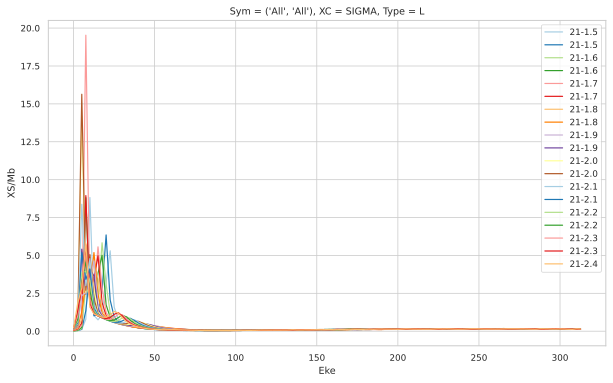

In [19]:
orbSubset = [key for key in data.data.keys() if key.startswith('orb21')]
data.plotGetCroComp(pType='SIGMA', Etype=Etype, Erange=Erange, keys = orbSubset)

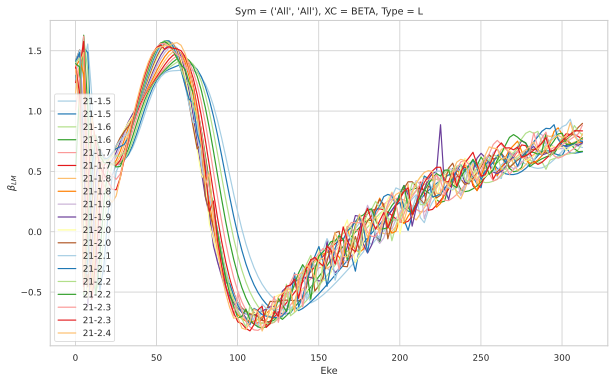

In [20]:
data.plotGetCroComp(pType='BETA', Etype=Etype, Erange=Erange, keys = orbSubset)

### Orb22

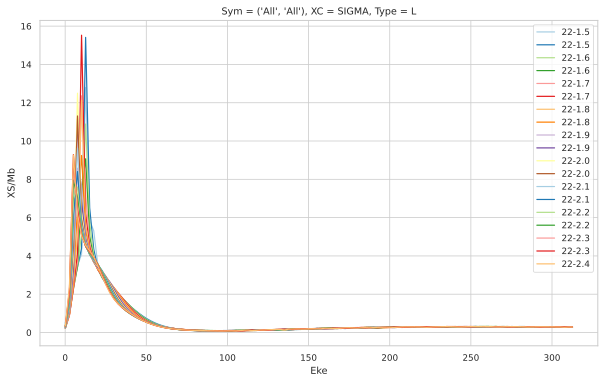

In [21]:
orbSubset = [key for key in data.data.keys() if key.startswith('orb22')]
data.plotGetCroComp(pType='SIGMA', Etype=Etype, Erange=Erange, keys = orbSubset)

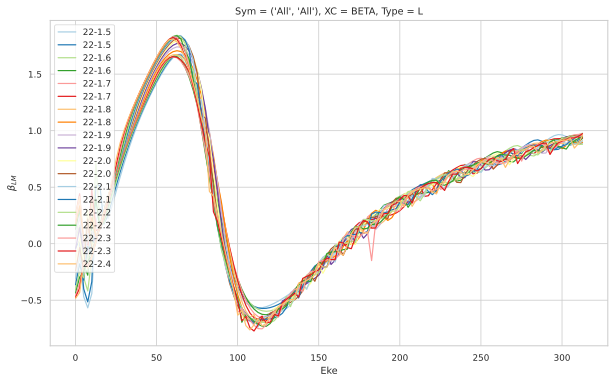

In [22]:
data.plotGetCroComp(pType='BETA', Etype=Etype, Erange=Erange, keys = orbSubset)

### Orb24

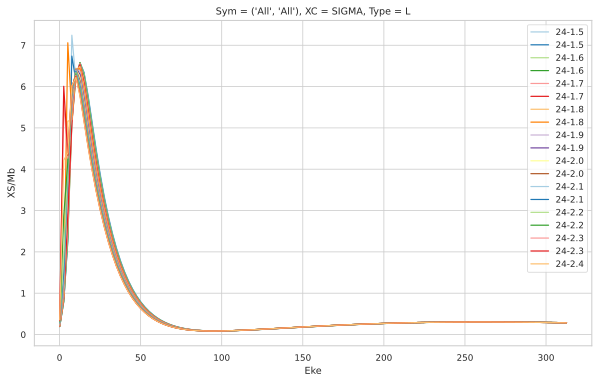

In [23]:
orbSubset = [key for key in data.data.keys() if key.startswith('orb24')]
data.plotGetCroComp(pType='SIGMA', Etype=Etype, Erange=Erange, keys = orbSubset)

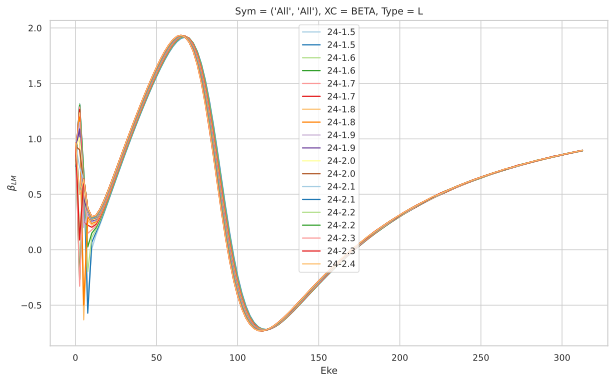

In [24]:
data.plotGetCroComp(pType='BETA', Etype=Etype, Erange=Erange, keys = orbSubset)

## Branching ratios

In [25]:
# Stack XS data to new data structure for BR processing
# Version 06/05/21 for bond-length scans - set to dict then stack to XR DataSet for processing.
# Dev for BR calcs, http://jake/jupyter/user/paul/lab/tree/ePS/N2O/epsproc/N2O_bondscan_NN_orb1-3_processing_070521.ipynb
# See also https://phockett.github.io/ePSdata/XeF2-preliminary/XeF2_ePS-expt_comp_271020_4d_v111120-dist.html#Branching-ratios
# Bit messy but working OK.

subset = {}
lText = []

Etype = 'Eke'
ErangeBR = [1, 300]  # May be necessary to set this in some cases, set to None to skip

#**** Working version XR v0.14
# for orb in ['orb1','orb2', 'orb3']:
# #     subset = {}
    
#     for key in data.data.keys():
    
#         if key.startswith(orb):
 
#             temp = data.data[key]['XS'].sel({'Sym':'All'}).squeeze()  #.copy().squeeze()  #.drop('Cont')
#             subset[key] = temp.copy().expand_dims({'Orb':[(key.split('-')[0])]}).expand_dims({'Bond':[float(key.split('-')[-1])]})

# dsXStemp = xr.Dataset(subset, compat='override')  # This is working OK for subset as full dict with expanded dims, xr v0.14, but fails in v0.17
# # dsXStemp = xr.Dataset(subset)

# # # Convert to Xarray & normalise
# # dsXS = dsXStemp.to_array().drop('variable')  # This leaves 'variable' dim with NaNs? (On Jake, xr v0.14)  #.rename({'variable':'channel'}).squeeze()
# dsXS = dsXStemp.to_array().sum('variable').squeeze()
# # dsXS['total'] = dsXS.sum('channel')  # Sum over channels

# # # Normalise...
# # dsXS = dsXS.sum('variable')  # Collapse redundant dim - should be a better way?
# # dsXS['total'] = dsXS.sum('Orb') # Total XS per bond lenght setting
# # dsXS = dsXS/dsXS['total']


#*** Tidying & retesting, xr v0.17
# This is OK if Ehv dim is dropped, otherwise get errors.
    
for key in data.data.keys():
    
    if key != 'conv':
        temp = data.data[key]['XS'].sel({'Sym':'All'}).drop('Ehv').squeeze()  #.copy().squeeze()  #.drop('Cont')
        subset[key] = temp.copy().expand_dims({'Orb':[(key.split('-')[0])]}).expand_dims({'Bond':[float(key.split('-')[-1])]})

# dsXStemp = xr.Dataset(subset, compat='override')  # This is working OK for subset as full dict with expanded dims, xr v0.14, but fails in v0.17
dsXStemp = xr.Dataset(subset)

# # Convert to Xarray & normalise
# dsXS = dsXStemp.to_array().drop('variable')  # This leaves 'variable' dim with NaNs? (On Jake, xr v0.14)  #.rename({'variable':'channel'}).squeeze()
dsXS = dsXStemp.to_array().sum('variable').squeeze()
# dsXS['total'] = dsXS.sum('channel')  # Sum over channels

# # Normalise...
# dsXS = dsXS.sum('variable')  # Collapse redundant dim - should be a better way?
dsXS['total'] = dsXS.sum('Orb') # Total XS per bond lenght setting
dsXS = dsXS/dsXS['total']

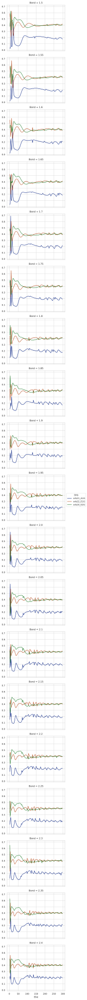

In [27]:
# Plot per bond-length

# Set specific cmap
cmapset = sns.color_palette("dark", dsXS.Orb.size) # bondRange[2]-1)
sns.set_palette(cmapset)

Etype = 'Eke'
Erange = ErangeBR  # [1,100]
gauge = 'L'
XCtype = 'SIGMA'

# N2Odata.plotGetCroComp(pType='SIGMA', Etype=Etype, Erange=Erange, pGauge = gauge);
dsXS.sel(**{Etype:slice(Erange[0], Erange[1])}, Type=gauge, XC = XCtype).plot.line(x=Etype, row='Bond');

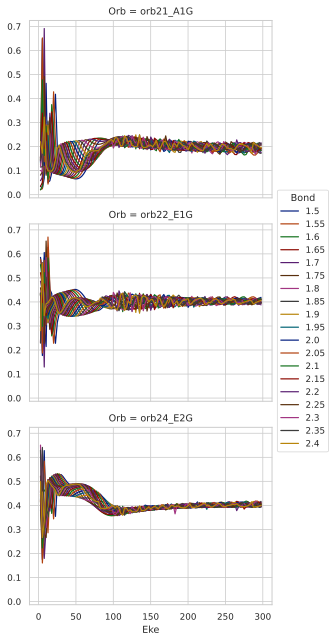

In [28]:
# Set specific cmap
cmapset = sns.color_palette("dark", dsXS.Bond.size) # bondRange[2]-1)
sns.set_palette(cmapset)

Etype = 'Eke'
Erange = ErangeBR  # [1,100]
gauge = 'L'
XCtype = 'SIGMA'

# N2Odata.plotGetCroComp(pType='SIGMA', Etype=Etype, Erange=Erange, pGauge = gauge);
dsXS.sel(**{Etype:slice(Erange[0], Erange[1])}, Type=gauge, XC = XCtype).plot.line(x=Etype, row='Orb');

## Post-processing: interpolation + convolutions

In [32]:
xr.__version__

'0.17.0'

In [171]:
# Stack XS data to new data structure for BR processing
# Version 06/05/21 for bond-length scans - set to dict then stack to XR DataSet for processing.
# Dev for BR calcs, http://jake/jupyter/user/paul/lab/tree/ePS/N2O/epsproc/N2O_bondscan_NN_orb1-3_processing_070521.ipynb
# See also https://phockett.github.io/ePSdata/XeF2-preliminary/XeF2_ePS-expt_comp_271020_4d_v111120-dist.html#Branching-ratios
# Bit messy but working OK.

subset = {}
lText = []

Etype = 'Eke'
ErangeBR = [1, 300]  # May be necessary to set this in some cases, set to None to skip

#**** Working version XR v0.14
# for orb in ['orb1','orb2', 'orb3']:
# #     subset = {}
    
#     for key in data.data.keys():
    
#         if key.startswith(orb):
 
#             temp = data.data[key]['XS'].sel({'Sym':'All'}).squeeze()  #.copy().squeeze()  #.drop('Cont')
#             subset[key] = temp.copy().expand_dims({'Orb':[(key.split('-')[0])]}).expand_dims({'Bond':[float(key.split('-')[-1])]})

# dsXStemp = xr.Dataset(subset, compat='override')  # This is working OK for subset as full dict with expanded dims, xr v0.14, but fails in v0.17
# # dsXStemp = xr.Dataset(subset)

# # # Convert to Xarray & normalise
# # dsXS = dsXStemp.to_array().drop('variable')  # This leaves 'variable' dim with NaNs? (On Jake, xr v0.14)  #.rename({'variable':'channel'}).squeeze()
# dsXS = dsXStemp.to_array().sum('variable').squeeze()
# # dsXS['total'] = dsXS.sum('channel')  # Sum over channels

# # # Normalise...
# # dsXS = dsXS.sum('variable')  # Collapse redundant dim - should be a better way?
# # dsXS['total'] = dsXS.sum('Orb') # Total XS per bond lenght setting
# # dsXS = dsXS/dsXS['total']


#*** Tidying & retesting, xr v0.17
# This is OK if Ehv dim is dropped, otherwise get errors.
    
for key in data.data.keys():
    
    if key != 'conv':
        temp = data.data[key]['XS'].sel({'Sym':'All'}).drop('Ehv').squeeze()  #.copy().squeeze()  #.drop('Cont')
        subset[key] = temp.copy().expand_dims({'Orb':[(key.split('-')[0])]}).expand_dims({'Bond':[float(key.split('-')[-1])]})

# dsXStemp = xr.Dataset(subset, compat='override')  # This is working OK for subset as full dict with expanded dims, xr v0.14, but fails in v0.17
dsXStemp = xr.Dataset(subset)

# # Convert to Xarray & normalise
# dsXS = dsXStemp.to_array().drop('variable')  # This leaves 'variable' dim with NaNs? (On Jake, xr v0.14)  #.rename({'variable':'channel'}).squeeze()
dsXS = dsXStemp.to_array().sum('variable').squeeze()
# dsXS['total'] = dsXS.sum('channel')  # Sum over channels

# # Normalise...
# dsXS = dsXS.sum('variable')  # Collapse redundant dim - should be a better way?
# dsXS['total'] = dsXS.sum('Orb') # Total XS per bond lenght setting
# dsXS = dsXS/dsXS['total']

In [178]:
# Interp, see https://phockett.github.io/ePSdata/XeF2-preliminary/XeF2_ePS-expt_comp_271020_4d_v111120-dist.html#Branching-ratios

# Xarray: http://xarray.pydata.org/en/stable/user-guide/interpolation.html
# Uses Scipy1D: https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.interp1d.html#scipy.interpolate.interp1d

interpFlag = True # Run interpolation routine?

if interpFlag:
    # Original calcs 0.1 - 312.6, 2.5eV steps
    # Updated calcs 0.1 - 300.1, 1.0eV steps
    # Set new axis
    # Erange = [0.1, 30.1]
    Erange = [0.1, 312.6]
    # Erange = [0.1, 300.1]
    EkeInt = np.arange(Erange[0], Erange[1], 2.5/4)

    # Add bond interp, for heavy case only have 0.1A steps
    Brange = [1.5, 2.4]
    # BInt = np.arange(Brange[0], Brange[1], 0.025)
    BInt = np.around(np.arange(Brange[0], Brange[1], 0.05),3)

    # .sel({'Eke':slice(0.1,30.1)})  # Don't need to slice, since will be subselected on interp
    # dsInt = dsXS.dropna('Eke').interp(Eke = EkeInt, method = 'cubic')
    # dsInt = dsXS.interp(Eke = EkeInt, method = 'quadratic')  # OK, aside from < 5eV
    # dsInt = dsXS.interp(Eke = EkeInt, method = 'cubic')  # With additional bond interp
    dsInt = dsXS.interp(Eke = EkeInt, Bond = BInt, method = 'cubic')  # With additional bond interp
    # dsInt = dsXS.interp(Eke = EkeInt, method = 'cubic',  kwargs={"fill_value": 0.0, "bounds_error": True} ) #fill_value = (0,20))  # Testing additional args - bonunds only on y!
    # dsInt = dsXS.interp(Eke = EkeInt, method = 'nearest')  # Very square!

    # Fix -ve values in XS - SURE THERE IS A SIMPLE WAY TO DO THIS!!!
    # dsInt = dsInt.where(dsInt.sel(XC='SIGMA')>0, 0)  # Sets for all data series,not just SIGMA
    # dsInt = dsInt.where(dsInt[:,:,0,:]>0, 0)  # Also no. Both XC dims still
    # dsInt[:,:,0,:] = dsInt.where(dsInt[:,:,0,:]>0, 0)  # Also no.  Throws errir
    dsInt.loc[:,:,:,'SIGMA',:] = dsInt.sel(XC='SIGMA').where(dsInt.sel(XC='SIGMA')>0, 1e-4)  # OK
    # dsInt.loc[:,:,'SIGMA',:] = dsInt.sel(XC='SIGMA').where(dsInt>0, 0)  # Nope
    
else:
    dsInt = dsXS.copy()

### Conv with 2D Gaussian kernel - single $\sigma$ test case.

In [182]:
from scipy.ndimage import gaussian_filter

# Basic 2D Gaussian filter... NOTE sigma ordering == Xarray dim order = [Bond,Eke] in test case
# This works OK on selected dims.
# If .copy() is omitted it also sets data in original da too.
sel = {'XC':'SIGMA', 'Type':'L'}
daFilt = dsInt.sel(sel).copy()

sigma = [4, 0, 0.8]  # In array units, must match array dim ordering!
daFilt[...] = gaussian_filter(daFilt, sigma = sigma)  # This works for 2D conv. Also looks OK for 3D case in quick tests with all Orb data.

# Sigma in real units
sigmaScaled = [sigma[0]*daFilt.Bond.diff('Bond')[0].values, sigma[2]*daFilt.Eke.diff('Eke')[0].values]
print(sigmaScaled)

[0.20000000000000018, 0.5]


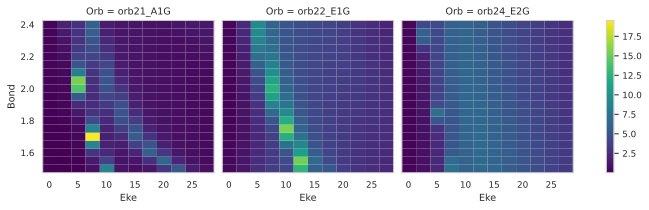

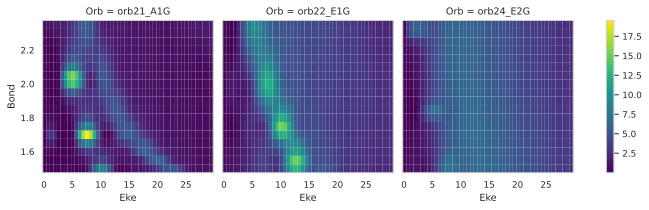

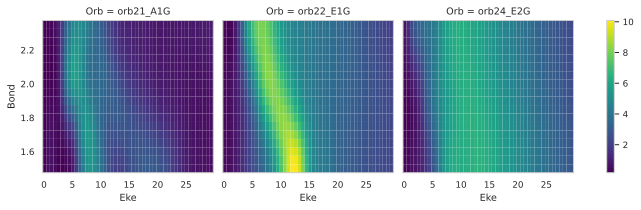

In [183]:
# dsInt.sel({'XC':'SIGMA','Type':'V'}).plot()
# dsInt.sel(sel).plot(col = 'Orb')

gauge = 'L'
XC = 'SIGMA'
Erange = [0, 30]

# Plot original data
dsXS.sel(Eke=slice(Erange[0], Erange[1]), Type=gauge, XC = XC).plot(col = 'Orb')
# Plot interpolated data
dsInt.sel(Eke=slice(Erange[0], Erange[1]), Type=gauge, XC = XC).plot(col = 'Orb')
# Plot convolved data
daFilt.sel(Eke=slice(Erange[0], Erange[1])).plot(col = 'Orb')

### Filter for a range of sigmas & restack

#### Cross-sections

In [184]:
# Basic 2D/3D Gaussian filter...
# This works OK on selected dims.
# If .copy() is omitted it also sets data in original da too.
sel = {'XC':'SIGMA', 'Type':'L'}

daSet = {}

sEke = 0.8
sigmas = []

for sVal in np.arange(0, 16, 2.0):
#     sigma = [sVal,sVal]  # In array units, both dims
    sigma = [sVal,0,sEke]  # With different sigma Eke
    daFilt = dsInt.sel(sel).copy()
#     daFilt[:,:] = gaussian_filter(daFilt, sigma = sigma)  # This works for 2D conv.
    daFilt[...] = gaussian_filter(daFilt, sigma = sigma)  # This works for 2D conv.

    # Sigma in real units
#     sigmaScaled = [sigma[0]*daFilt.Bond.diff('Bond')[0].values, sigma[1]*daFilt.Eke.diff('Eke')[0].values]
#     print(sVal, sigmaScaled)
    sigmas.append([sVal, sigma[0]*daFilt.Bond.diff('Bond')[0].values, sigma[2]*daFilt.Eke.diff('Eke')[0].values])

    daSet[sVal] = daFilt.copy()
    
# Restact data
daFiltSigma = xr.Dataset(daSet).to_array(dim='sigma')   #.sel({'Bond':2.0})
# daFiltSigma['Ehv'] = ('Eke', daFilt.Eke.values+75)  # Set approx Ehv vals.

daFiltSigma['sigmaBond'] = ('sigma', np.array(sigmas)[:,1].round(2))

In [185]:
np.array(sigmas)[:,1].round(2)
# daFiltSigma.Bond[6]

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7])

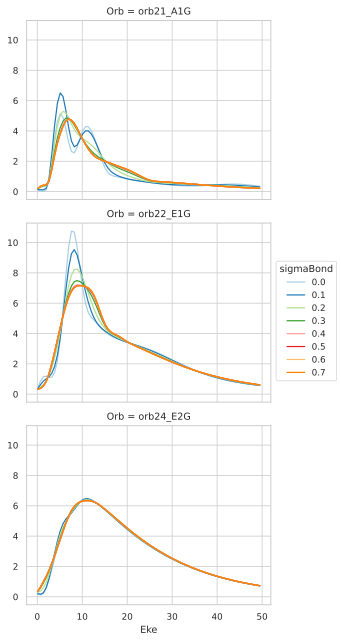

In [186]:
# daFiltSigma.Bond[6]
# type(np.float64(1.95))
# daFiltSigma.sel(Bond=np.float32(1.95), Eke=slice(0,50)).swap_dims({'sigma':'sigmaBond'}).plot.line(x='Eke'); # Currently not working for float selection?
                                                                                                                # Might be dType issue? https://github.com/pydata/xarray/issues/3137
                                                                                                                # ACTUALLY, likely rounding for interp bond lengths!!!!
daFiltSigma.sel(Bond=1.95, Eke=slice(0,50)).swap_dims({'sigma':'sigmaBond'}).plot.line(x='Eke', row='Orb');  # Float selection OK from array value


#### Betas

In [187]:
# Basic 2D Gaussian filter...
# This works OK on selected dims.
# If .copy() is omitted it also sets data in original da too.
sel = {'XC':'BETA', 'Type':'L'}

daSet = {}

sEke = 0.8

for sVal in np.arange(0, 16, 2.0):
#     sigma = [sVal,sVal]  # In array units, both dims
    sigma = [sVal,0,sEke]  # With different sigma Eke
    daFilt = dsInt.sel(sel).copy()
    daFilt[...] = gaussian_filter(daFilt, sigma = sigma)  # This works for 2D conv.

    # Sigma in real units
    sigmaScaled = [sigma[0]*daFilt.Bond.diff('Bond')[0].values, sigma[2]*daFilt.Eke.diff('Eke')[0].values]
    print(sVal, sigmaScaled)

    daSet[sVal] = daFilt.copy()
    
# Restact data
daFiltBeta = xr.Dataset(daSet).to_array(dim='sigma')   #.sel({'Bond':2.0})
# daFiltBeta['Ehv'] = ('Eke', (75+30)-daFilt.Eke.values)  # Set approx Ehv vals.

daFiltBeta['sigmaBond'] = ('sigma', np.array(sigmas)[:,1].round(2))

0.0 [0.0, 0.5]
2.0 [0.10000000000000009, 0.5]
4.0 [0.20000000000000018, 0.5]
6.0 [0.30000000000000027, 0.5]
8.0 [0.40000000000000036, 0.5]
10.0 [0.5000000000000004, 0.5]
12.0 [0.6000000000000005, 0.5]
14.0 [0.7000000000000006, 0.5]


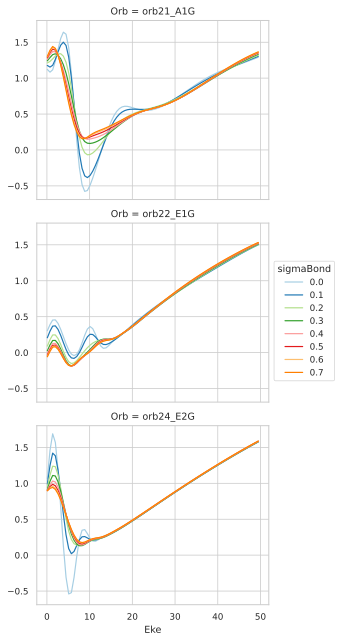

In [188]:
# daFiltSigma.Bond[6]
# type(np.float64(1.95))
# daFiltSigma.sel(Bond=np.float32(1.95), Eke=slice(0,50)).swap_dims({'sigma':'sigmaBond'}).plot.line(x='Eke'); # Currently not working for float selection?
                                                                                                                # Might be dType issue? https://github.com/pydata/xarray/issues/3137
                                                                                                                # ACTUALLY, likely rounding for interp bond lengths!!!!
daFiltBeta.sel(Bond=daFiltSigma.Bond[6], Eke=slice(0,50)).swap_dims({'sigma':'sigmaBond'}).plot.line(x='Eke', row='Orb');  # Float selection OK from array value


#### Tidy-up

In [189]:
# Restack & push convolution results to data structure for plotters
# ACTUALLY THIS IS A PAIN - current plotters assume a lot of dims to match ePS output, not subelections.
# UGH WRITE BETTER CODE
data.data['conv'] = {}
data.data['conv']['XS'] = xr.concat([daFiltSigma, daFiltBeta], dim = 'XC')
# data.data['conv']['XS']['Ehv'] = ('Eke', (75+30)-data.data['conv']['XS'].Eke.values)  # Set approx Ehv vals.
data.data['conv']['XS']['Ehv'] = ('Eke', 75 + data.data['conv']['XS'].Eke.values) # Set approx Ehv vals.
# data.data['conv']['XS'].expand_dims({'Type':['L']})  #,'Sym':[('All','All')]})

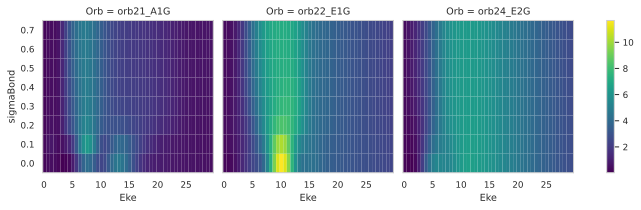

In [190]:
sel = {'XC':'SIGMA', 'Bond':data.data['conv']['XS'].Bond[6], 'Eke':slice(0,30)}
data.data['conv']['XS'].sel(sel).swap_dims({'sigma':'sigmaBond'}).plot(col='Orb')
# plt.savefig('xef2_XS_orb21-bondscan_Gconv_120521.png', format='png')

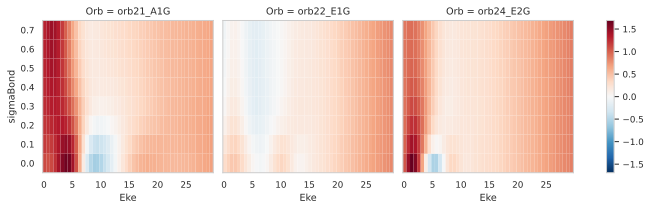

In [191]:
sel = {'XC':'BETA', 'Bond':data.data['conv']['XS'].Bond[6], 'Eke':slice(0,30)}
data.data['conv']['XS'].sel(sel).swap_dims({'sigma':'sigmaBond'}).plot(col='Orb')
# plt.savefig('xef2_beta_orb21-bondscan_Gconv_120521.png', format='png')

## Quick checks vs. exp data

From https://phockett.github.io/ePSdata/XeF2-preliminary/xe-xef2_plots-notes_220421.html#Experimental-data

- Set 1: RF processed results, 02/10/20
- Set 2: DH ion yields, 27/10/20

MODIFIED here to plot convolved bond-scan results.

In [60]:
# Load experimental data
# dataPathExpt = Path(r'D:\projects\XeF2_Soleil_2019\RF_data_analysis_021020')
# dataPathExpt = Path(r'~/ePS/XeF2_2020/RF_data_analysis_021020') # On Jake
dataPathExpt = Path(r'/home/paul/ePS/XeF2_2020/RF_data_analysis_021020') # On Jake

# Set data attribs in dict similar to ePS results structure
dataFiles = {}
dataFiles['SIGMA'] = {'Data':'XS', 'File':r'XeF2_Xe4d_4d32_4d52_cross_sec_all_photon_energies_02102020.dat', 
                      'States':['$4d_{3/2}$', '$4d_{5/2}$']}
dataFiles['BETA'] = {'Data':'Beta', 'File':r'XeF2_Xe4d_beta_all_photon_energies_02102020.dat', 
                     'States':['$\Pi_{1/2} (4d_{3/2})$', '$\Delta_{3/2} (4d_{3/2})$', '$\Sigma_{1/2} (4d_{5/2})$', 
                               '$\Pi_{3/2} (4d_{5/2})$', '$\Delta_{5/2} (4d_{5/2})$']}

dataFiles['BR-All'] = {'Data':'Branching ratios', 'File':r'XeF2_Xe4d_branching_all_photon_energies_all_states_01112020.dat', 
                      'States':['$\Pi_{1/2} (4d_{3/2})$', '$\Delta_{3/2} (4d_{3/2})$', '$\Sigma_{1/2} (4d_{5/2})$', 
                               '$\Pi_{3/2} (4d_{5/2})$', '$\Delta_{5/2} (4d_{5/2})$']}
dataFiles['BR-SO-summed'] = {'Data':'Branching ratios SO summed', 'File':r'XeF2_Xe4d_branching_all_photon_energies_SO_av_01112020.dat', 
                     'States':['$\Pi$', '$\Delta$', '$\Sigma$']}

# Update with ion data
dataFiles2 = {}
dataFiles2['ION-low'] = {'Data':'XS', 'File':r'XeF2_ion_yield_low_energy_cal.txt'}
dataFiles2['ION-high'] = {'Data':'XS', 'File':r'XeF2_ion_yield_high_energy_cal.txt'}
                         
# Update with branching ratios
# dataFilesBR = {}
# dataFilesBR['All'] = {'Data':'Branching ratios', 'File':r'XeF2_Xe4d_branching_all_photon_energies_all_states_01112020.dat', 
#                       'States':['\pi1/2 (4d3/2)', '\delta3/2 (4d3/2)', '\sigma1/2 (4d5/2)', '\pi3/2 (4d5/2)', '\delta5/2 (4d5/2)']}
# dataFiles['SO-summed'] = {'Data':'Branching ratios SO summed', 'File':r'XeF2_Xe4d_branching_all_photon_energies_SO_av_01112020.dat', 
#                      'States':['\pi', '\delta', '\sigma']}

In [61]:
# Read data files and convert to Xarray
# 27/10/20 added quick hack to set 2nd array for ion yield data
dataList = []
dataList2 = []
for key in dataFiles:
    dataIn = np.loadtxt(dataPathExpt/dataFiles[key]['File'])
    
    # Convert to Xarray
    dataXr = xr.DataArray(dataIn[:,1:], dims=('Ehv','State'), coords={'Ehv':dataIn[:,0], 'State':dataFiles[key]['States'][0:dataIn.shape[1]-1]})
    dataXr.attrs = dataFiles[key]
    dataXr.attrs['dataPath'] = dataPathExpt
    dataXr.name = key
    dataList.append(dataXr)

# Stack to Xarray
dataExpt = xr.concat(dataList, "XC")
dataExpt['XC'] = list(dataFiles.keys())

for key in dataFiles2:
    dataIn = np.loadtxt(dataPathExpt/dataFiles2[key]['File'])
    
    # Convert to Xarray
    dataXr = xr.DataArray(dataIn[:,1].squeeze(), dims=('Ehv'), coords={'Ehv':dataIn[:,0]})  # Only 1D datasets in this case
    dataXr.attrs = dataFiles2[key]
    dataXr.attrs['dataPath'] = dataPathExpt
    dataXr.name = key
    dataList2.append(dataXr)

dataExpt2 = xr.concat(dataList2, "XC")
dataExpt2['XC'] = list(dataFiles2.keys())

### Theory & expt plots, single orb, range of $\sigma$

Text(0.5, 1.0, 'orb21_A1G data for various $\\sigma$ (Angs.), vs. experiment')

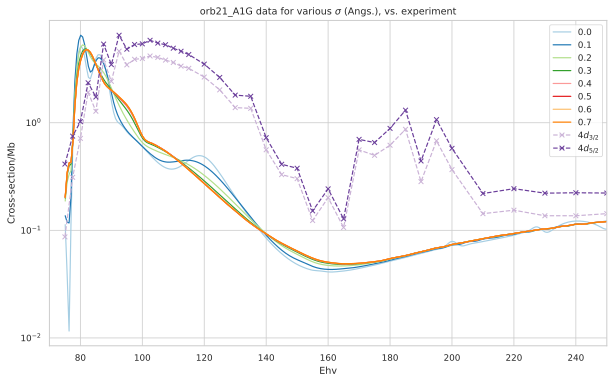

In [200]:
# sns.color_palette("cubehelix")
# sns.set_palette("Reds")
# sns.set_palette("Paired")

# Compare with computational results
marker = 'x'
Etype = 'Ehv'
Erange = [70, 250]
bond = 1.95  # data.data['conv']['XS'].Bond[6] #1.9  # Sub selection for convolution data
orb = 'orb21_A1G'

pType = 'SIGMA'
selConv = {'XC':pType,'Bond':bond, 'Orb':orb}  # Sub selection for convolution data

# pltObj, lTextComp = data.plotGetCroComp(pGauge=None, pSym=None, keys = 'conv', pType=pType, Etype = Etype, Erange = Erange, returnHandles = True)
# pltObj = data.data['conv']['XS'].sel(selConv).swap_dims({'Eke':'Ehv'}).plot.line(x='Ehv', col='Orb');
pltObj = data.data['conv']['XS'].sel(selConv).swap_dims({'Eke':'Ehv'}).plot.line(x='Ehv');
# lText = lTextComp.copy()
lText = data.data['conv']['XS'].sel(selConv).sigmaBond.data.tolist()

# Add expt data - cross-secions
# refKey = 'orb21_A1G-1.500'
# scale = dataExpt.sel({'XC':pType}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType, 'Type':'L'}).max()  # Set scaling to match computational data
refKey = 'conv'
scale = dataExpt.sel({'XC':pType}).max() / data.data[refKey]['XS'].sel(selConv).max()  # Set scaling to match computational data
# scale = 1
(dataExpt.sel({'XC':pType})/scale).dropna('State').plot.line(x='Ehv', marker=marker, ls='--');

# Add expt data - ion yields
# ionData = 'ION-high'
# scale = dataExpt2.sel({'XC':ionData}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType}) #, 'Type':'L'}).max()  # Set scaling to match computational data
# (dataExpt2.sel({'XC':ionData})/scale).plot.line(x='Ehv', marker=marker, ls='--');

# Manual legend fix
lText.extend(dataExpt.sel({'XC':pType}).dropna('State').coords['State'].data)
# lText.extend([ionData])
plt.legend(lText)

# Fix axis labels
if pType == 'SIGMA':
    plt.ylabel('Cross-section/Mb')
#     plt.title('Cross-sections (normalised to computational results)')
    plt.title('')
else:
    plt.ylabel(r"$\beta_{LM}$")
#     plt.title(r"$\beta_{LM}$")
    
# Fix plot x-axis
plt.xlim(Erange);

plt.yscale("log")  # Use log scale y-axis?
plt.title(f"{orb} data for various $\sigma$ (Angs.), vs. experiment");

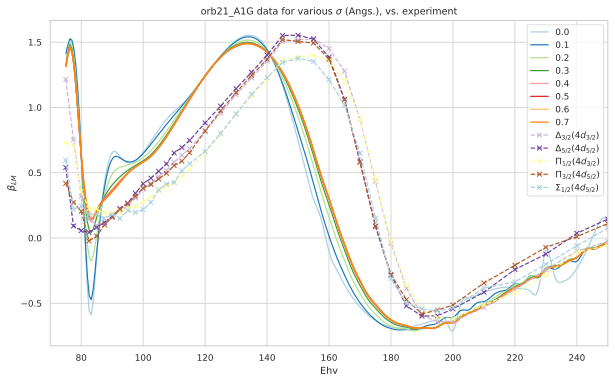

In [210]:
# sns.color_palette("cubehelix")
# sns.set_palette("Reds")
# sns.set_palette("Paired")

# Compare with computational results
# marker = None #'x'
# Etype = 'Ehv'
# Erange = [70, 300]


pType = 'BETA'
selConv = {'XC':pType,'Bond':bond, 'Orb':orb}  # Sub selection for convolution data

# pltObj, lTextComp = data.plotGetCroComp(pGauge=None, pSym=None, keys = 'conv', pType=pType, Etype = Etype, Erange = Erange, returnHandles = True)
pltObj = data.data['conv']['XS'].sel(selConv).swap_dims({'Eke':'Ehv'}).plot.line(x='Ehv');
# lText = lTextComp.copy()
lText = data.data['conv']['XS'].sel(selConv).sigmaBond.data.tolist()

# Add expt data - cross-secions
# refKey = 'orb21_A1G-1.500'
# scale = dataExpt.sel({'XC':pType}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType, 'Type':'L'}).max()  # Set scaling to match computational data
refKey = 'conv'
scale = dataExpt.sel({'XC':pType}).max() / data.data[refKey]['XS'].sel(selConv).max()  # Set scaling to match computational data
# scale = 1
(dataExpt.sel({'XC':pType})/scale).dropna('State').plot.line(x='Ehv', marker=marker, ls='--');

# Add expt data - ion yields
# ionData = 'ION-high'
# scale = dataExpt2.sel({'XC':ionData}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType}) #, 'Type':'L'}).max()  # Set scaling to match computational data
# (dataExpt2.sel({'XC':ionData})/scale).plot.line(x='Ehv', marker=marker, ls='--');

# Manual legend fix
lText.extend(dataExpt.sel({'XC':pType}).dropna('State').coords['State'].data)
# lText.extend([ionData])
plt.legend(lText)

# Fix axis labels
if pType == 'SIGMA':
    plt.ylabel('Cross-section/Mb')
#     plt.title('Cross-sections (normalised to computational results)')
    plt.title('')
else:
    plt.ylabel(r"$\beta_{LM}$")
#     plt.title(r"$\beta_{LM}$")
    
# Fix plot x-axis
plt.xlim(Erange);

# plt.yscale("log")  # Use log scale y-axis?
plt.title(f"{orb} data for various $\sigma$ (Angs.), vs. experiment");

### Theory & expt plots, all orbs, single $\sigma$

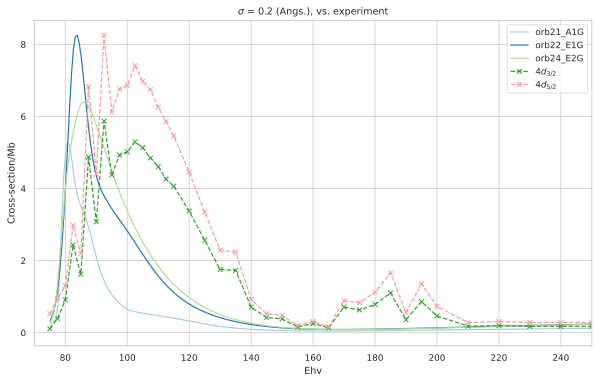

In [208]:
# All orbs, set sigma


# sns.color_palette("cubehelix")
# sns.set_palette("Reds")
# sns.set_palette("Paired")

# Compare with computational results
# marker = None #'x'
# Etype = 'Ehv'
# Erange = [70, 300]


pType = 'SIGMA'
selConv = {'XC':pType,'Bond':bond, 'sigma':4.0}  # Sub selection for convolution data

# pltObj, lTextComp = data.plotGetCroComp(pGauge=None, pSym=None, keys = 'conv', pType=pType, Etype = Etype, Erange = Erange, returnHandles = True)
pltObj = data.data['conv']['XS'].sel(selConv).swap_dims({'Eke':'Ehv'}).plot.line(x='Ehv');
lText = data.data['conv']['XS'].sel(selConv).Orb.data.tolist()
sigmaBond = data.data['conv']['XS'].sel(selConv).sigmaBond.data

# Add expt data - cross-secions
# refKey = 'orb21_A1G-1.500'
# scale = dataExpt.sel({'XC':pType}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType, 'Type':'L'}).max()  # Set scaling to match computational data
refKey = 'conv'
scale = dataExpt.sel({'XC':pType}).max() / data.data[refKey]['XS'].sel(selConv).max()  # Set scaling to match computational data
# scale = 1
(dataExpt.sel({'XC':pType})/scale).dropna('State').plot.line(x='Ehv', marker=marker, ls='--');

# Add expt data - ion yields
# ionData = 'ION-high'
# scale = dataExpt2.sel({'XC':ionData}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType}) #, 'Type':'L'}).max()  # Set scaling to match computational data
# (dataExpt2.sel({'XC':ionData})/scale).plot.line(x='Ehv', marker=marker, ls='--');

# Manual legend fix
lText.extend(dataExpt.sel({'XC':pType}).dropna('State').coords['State'].data)
# lText.extend([ionData])
plt.legend(lText)

# Fix axis labels
if pType == 'SIGMA':
    plt.ylabel('Cross-section/Mb')
#     plt.title('Cross-sections (normalised to computational results)')
    plt.title('')
else:
    plt.ylabel(r"$\beta_{LM}$")
#     plt.title(r"$\beta_{LM}$")
    
# Fix plot x-axis
plt.xlim(Erange);

# plt.yscale("log")  # Use log scale y-axis?
plt.title(f"$\sigma$ = {sigmaBond} (Angs.), vs. experiment");

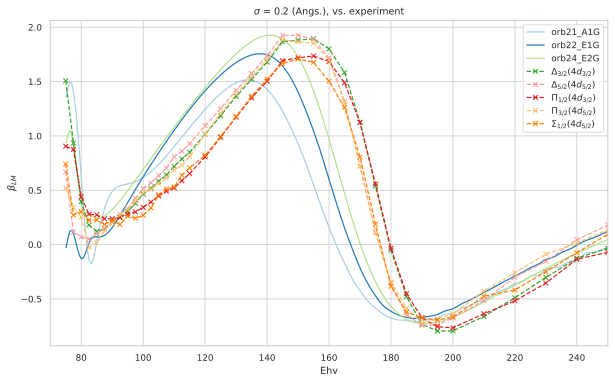

In [209]:
# All orbs, set sigma


# sns.color_palette("cubehelix")
# sns.set_palette("Reds")
# sns.set_palette("Paired")

# Compare with computational results
# marker = None #'x'
# Etype = 'Ehv'
# Erange = [70, 300]


pType = 'BETA'
selConv = {'XC':pType,'Bond':bond, 'sigma':4.0}  # Sub selection for convolution data

# pltObj, lTextComp = data.plotGetCroComp(pGauge=None, pSym=None, keys = 'conv', pType=pType, Etype = Etype, Erange = Erange, returnHandles = True)
pltObj = data.data['conv']['XS'].sel(selConv).swap_dims({'Eke':'Ehv'}).plot.line(x='Ehv');
lText = data.data['conv']['XS'].sel(selConv).Orb.data.tolist()

# Add expt data - cross-secions
# refKey = 'orb21_A1G-1.500'
# scale = dataExpt.sel({'XC':pType}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType, 'Type':'L'}).max()  # Set scaling to match computational data
refKey = 'conv'
scale = dataExpt.sel({'XC':pType}).max() / data.data[refKey]['XS'].sel(selConv).max()  # Set scaling to match computational data
# scale = 1
(dataExpt.sel({'XC':pType})/scale).dropna('State').plot.line(x='Ehv', marker=marker, ls='--');

# Add expt data - ion yields
# ionData = 'ION-high'
# scale = dataExpt2.sel({'XC':ionData}).max() / data.dataSets[refKey]['XS'].sel({'XC':pType}) #, 'Type':'L'}).max()  # Set scaling to match computational data
# (dataExpt2.sel({'XC':ionData})/scale).plot.line(x='Ehv', marker=marker, ls='--');

# Manual legend fix
lText.extend(dataExpt.sel({'XC':pType}).dropna('State').coords['State'].data)
# lText.extend([ionData])
plt.legend(lText)

# Fix axis labels
if pType == 'SIGMA':
    plt.ylabel('Cross-section/Mb')
#     plt.title('Cross-sections (normalised to computational results)')
    plt.title('')
else:
    plt.ylabel(r"$\beta_{LM}$")
#     plt.title(r"$\beta_{LM}$")
    
# Fix plot x-axis
plt.xlim(Erange);

# plt.yscale("log")  # Use log scale y-axis?
plt.title(f"$\sigma$ = {sigmaBond} (Angs.), vs. experiment");

## SO with bond-averaged results

Code adapted from https://phockett.github.io/ePSdata/XeF2-preliminary/xe-xef2_plots-notes_220421.html#Spin-orbit

In [65]:
from epsproc.geomFunc.geomUtils import genllLList
from epsproc.geomFunc.geomCalc import w3jTable

# Gen QNs for specific (L,S) case
L = 2
S = 0.5

Llist = np.array([[L,L+S,S], [L, L, S], [L,L-S,S]])   # Note this needs to be 2D array in current form of function
QNs = genllLList(Llist, uniqueFlag = False)

# Then calc 3js....
backend = 'sympy'
form = 'xdaLM'  # '2d'  # 'xdaLM'  # xds
nonzeroFlag = True

dlist = ['L', 'J', 'S', 'Lambda', 'Omega', 'Sigma']  # Set dims for reference

thrj = w3jTable(QNs = QNs, nonzeroFlag = nonzeroFlag, form = form, dlist = dlist, backend = backend)

# And primed terms (will be identical at this point, but set dims for multiplication later)
thrjP = w3jTable(QNs = QNs, nonzeroFlag = nonzeroFlag, form = form, dlist = [item + 'p' for item in dlist], backend = backend)

In [66]:
# Reformate by comsolidating +/- terms as modulation for XS and square
thrjUS = thrj.unstack('mSet').fillna(0)
# thrjXSmod = 2*(thrjUS.sum('Sigma').where((thrjUS['Lambda']>-0.5)&(thrjUS['Omega']<0.5), drop=True))**2  # Note Lambda & Omega anti-phase!
thrjXSmod = 2*(thrjUS.sum('Sigma').where((thrjUS['Lambda']>-0.5)&(thrjUS['Omega']<0.5), drop=True))**2  # Note Lambda & Omega anti-phase!
thrjXSmod['Omega'] = np.abs(thrjXSmod['Omega'])

pdTable, _ = ep.multiDimXrToPD(thrjXSmod, colDims = 'Lambda')
pdTable

Lambda             0.0       1.0       2.0
J   L   Omega S                           
1.5 2.0 2.5   0.5  0.0  0.000000  0.000000
        1.5   0.5  0.0  0.100000  0.400000
        0.5   0.5  0.2  0.300000  0.000000
2.5 2.0 2.5   0.5  0.0  0.000000  0.333333
        1.5   0.5  0.0  0.266667  0.066667
        0.5   0.5  0.2  0.133333  0.000000

In [67]:
# SO branching ratios

# 11/11/20 - converted to function

def simulateSOBR(dsXS, thrjSOTerm, BRtype = 'All', coupling = 'Lambda', stateLabels = ['$\Sigma$', '$\Pi$', '$\Delta$']):
    # Set Lambda terms
    # dsXS['Lambda'] = dsXS['channel']
    # dsXS['Lambda'] = [0.0, 1.0, 2.0]
    
    dsXSO = dsXS.assign_coords({coupling:('channel',thrjSOTerm[coupling])}).swap_dims({'channel':coupling})  # Assign Lambda for multiplication
    
    dsXSO = dsXSO.assign_coords({f'{coupling}-Labels':(coupling, np.asarray(stateLabels)[dsXSO[coupling].astype(int).data])})  # Assign labels, based on int values as indexers (CRUDE!)


        
    dsXSO = dsXSO * thrjSOTerm 
    # dsXS

    # Convert to branching ratios (total)
    if BRtype == 'All':
#         dsXSO['total'] = dsXSO.sum(['Lambda', 'Omega', 'lSet'])  # Sum over channels
        dsXSO['total'] = dsXSO.sum(thrjSOTerm.dims)
    
    elif BRtype == 'J':
        dsXSO['total'] = dsXSO.sum(['Lambda', 'Omega'])  # Sum over channels, except J - GIVES same result? 
        
    elif BRtype == 'None':
        dsXSO['total'] = 1.0
        
    else:
        print(f'BRtype={BRtype} not recognised.')
        return

    # # Set branching ratios
    dsXSO = dsXSO/dsXSO['total']

    return dsXSO

### **State selected** Assuming both $\Lambda$ and $\Omega$ are defined... as per experimental assignments (?)

Label levels by ($\Omega$, $\Lambda$), with no additional summation over terms. Q: is this justified/realistic?

NOTE: seeing good results with Omega coupling scheme for 5/2, but better results for Lambda with 3/2 - different ion state ordering? Other effects going on?

SigmaBond = 0.2 (sigma = 4.0 in grid units) looks reasonable - similar to previous results sets, with some smoothing and clamping of values.

TODO: replot with hvplot for a closer look!

In [212]:
selConv

{'XC': 'SIGMA', 'Bond': 1.95, 'Orb': 'orb21_A1G', 'sigma': 4.0}

In [214]:
# Set up dsXS as previously (subselect on sigma) - TODO try multiple sigma? Should propagate OK - seeing some quite different results vs. sigma as expected.

# selConv['XC'] = 'SIGMA'  # Use same selection criteria as above, or modify
# selConv['sigma'] = 4.0
# selConv.pop('sigma')  # Remove sigma for all sigma plotting

pType = 'SIGMA'
selConv = {'XC':pType,'Bond':bond, 'sigma':4.0}

dsXS = data.data['conv']['XS'].sel(selConv).rename({'Orb':'channel'})  

dsXS['total'] = dsXS.sum('channel')  # Sum over channels

# Normalise... Q: is this required in this case? Probably!
dsXS = dsXS/dsXS['total']

# Test E-shift... As previously ~10eV shift looks pretty good, for 3/2 case at least.
# dsXS['Ehv'] = dsXS.Ehv + 10.0

dsXS

<xarray.DataArray (channel: 3, Eke: 500)>
array([[0.2380333 , 0.25048915, 0.21178151, ..., 0.19667405, 0.19725651,
        0.19761708],
       [0.40552361, 0.40124921, 0.40243041, ..., 0.40098973, 0.40090517,
        0.40093685],
       [0.35644309, 0.34826164, 0.38578808, ..., 0.40233622, 0.40183832,
        0.40144608]])
Coordinates:
  * channel    (channel) <U9 'orb21_A1G' 'orb22_E1G' 'orb24_E2G'
    Cont       <U3 'All'
    XC         <U5 'SIGMA'
    Type       <U1 'L'
  * Eke        (Eke) float64 0.1 0.725 1.35 1.975 ... 310.1 310.7 311.4 312.0
    Bond       float64 1.95
    sigma      float64 4.0
    sigmaBond  float64 0.2
    Ehv        (Eke) float64 75.1 75.72 76.35 76.97 ... 385.1 385.7 386.4 387.0
    total      (Eke) float64 0.7869 1.121 1.564 2.169 ... 0.7118 0.7119 0.7119

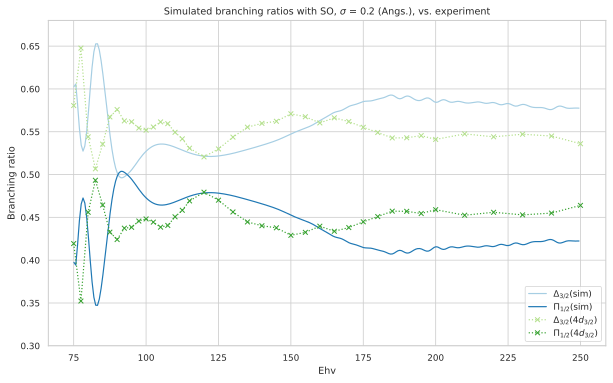

In [239]:
pType = 'BR-All'
Etype = 'Ehv'
coupling = 'Omega'  # 'Lambda'   # 'Omega'

# Selected term(s) only - LOOKS GOOD FOR coupling='Omega' case, but opposite phases for coupling='Lambda'
# dsXSO = simulateSOBR(dsXS, thrjXSmod, BRtype = 'None', coupling='Omega')  # This looks good
dsXSO = simulateSOBR(dsXS, thrjXSmod, BRtype = 'None', coupling=coupling)
# dsXSO = simulateSOBR(dsXS, np.abs(thrjXSmodCoherent), BRtype = 'None', coupling='Lambda')  # Testing coherent case

# Unnorm
# dsXSO *= dsXSO['total']

# Selected term(s) only
J=1.5
OLset = [[2,1.5], [1,0.5]] # [Omega, Lambda] pairs to match expt.
# OLset = [[1,0.5],[2,1.5]] # [Omega, Lambda] pairs to match expt.
# OLset = [[1.5,2], [0.5,1]]  # Check ordering OK! 

# J=2.5
# OLset = [[2,2.5], [1,1.5], [0,0.5]] # [Omega, Lambda] pairs to match expt.

# subset = xr.DataArray()
subset = []
for OL in OLset:
#     subset.append((dsXSO).swap_dims({'Eke':'Ehv'}).sel(**{Etype:slice(Erange[0], Erange[1])}, Type='L', J=J, Lambda=OL[0], Omega=OL[1]))
    subset.append((dsXSO).swap_dims({'Eke':'Ehv'}).sel(**{Etype:slice(Erange[0], Erange[1])}, J=J, Lambda=OL[0], Omega=OL[1]))

subsetXS = xr.concat(subset, dim='Omega').squeeze()

# Renorm
subsetXS = subsetXS/subsetXS.sum('Omega')

if 'sigma' in subsetXS.dims:
    subsetXS.plot.line(x=Etype, row='sigma')
else:
    subsetXS.plot.line(x=Etype)

# Selected states only
if J == 1.5:
    statesPlot = ['$\\Delta_{3/2} (4d_{3/2})$', '$\\Pi_{1/2} (4d_{3/2})$']
else:
    statesPlot = ['$\\Delta_{5/2} (4d_{5/2})$', '$\\Pi_{3/2} (4d_{5/2})$', '$\\Sigma_{1/2} (4d_{5/2})$']
    
scale = 1
(dataExpt.sel({'XC':pType, 'State':statesPlot})/scale).plot.line(x='Ehv', marker=marker, ls=':');


# Manual legend fix
# lText = list(subsetXS['Omega'].data)
# lText = list(OLset)
lText = [f"{item.split(' ')[0]}$(sim)" for item in statesPlot]
# lText = list(subsetXS['Lambda'].data)
lText.extend(statesPlot)
# lText.extend(dataExpt.sel({'XC':pType}).dropna('State').coords['State'].data)
plt.legend(lText, loc='lower right')

plt.ylabel("Branching ratio")
# plt.title(f'Simulated branching ratios, J={J}, Hund\'s case (c), with subselection (no summation)')
# plt.title("");
plt.title(f"Simulated branching ratios with SO, $\sigma$ = {sigmaBond} (Angs.), vs. experiment");

plt.ylim([0.3, 0.68]);  # Set ylims to avoid large peaks

# Set data for export later...
brsoJ1=subsetXS.copy()

Comparison of experimental (dashed lines) and computational (solid lines) branching ratios for $J=3/2$.

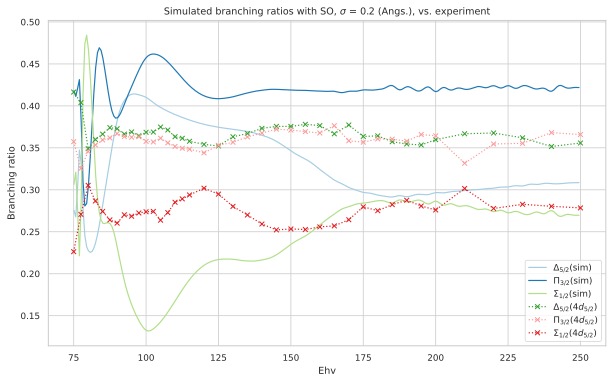

In [240]:
# Selected term(s) only
# Selected term(s) only - LOOKS GOOD FOR coupling='Omega' case, but opposite phases for coupling='Lambda'
# For J = 5/2 'Lambda' case is possibly better, at least for state ordering? DO NOT UNDERSTAND THIS YET!
# scale = 1
dsXSO = simulateSOBR(dsXS, thrjXSmod, BRtype = 'None', coupling=coupling)

# Unnorm
# dsXSO *= dsXSO['total']

# Selected term(s) only
# J=1.5
# OLset = [[2,1.5], [1,0.5]] # [Omega, Lambda] pairs to match expt.

J=2.5
# OLset = [[2,2.5], [1,1.5], [0,0.5]] # [Omega, Lambda] pairs to match expt.
OLset = [[0,0.5], [1,1.5], [2,2.5]] # [Omega, Lambda] pairs to match expt - REVERSED STATE ORDERING, justified by ion state energy ordering?

# subset = xr.DataArray()
subset = []
for OL in OLset:
#     subset.append((dsXSO).swap_dims({'Eke':'Ehv'}).sel(**{Etype:slice(Erange[0], Erange[1])}, Type='L', J=J, Lambda=OL[0], Omega=OL[1]))
    subset.append((dsXSO).swap_dims({'Eke':'Ehv'}).sel(**{Etype:slice(Erange[0], Erange[1])}, J=J, Lambda=OL[0], Omega=OL[1]))

subsetXS = xr.concat(subset, dim='Omega').squeeze()

# Renorm
subsetXS = subsetXS/subsetXS.sum('Omega')

if 'sigma' in subsetXS.dims:
    subsetXS.plot.line(x=Etype, row='sigma')
else:
    subsetXS.plot.line(x=Etype)

# Selected states only
if J == 1.5:
    statesPlot = ['$\\Delta_{3/2} (4d_{3/2})$', '$\\Pi_{1/2} (4d_{3/2})$']
else:
    statesPlot = ['$\\Delta_{5/2} (4d_{5/2})$', '$\\Pi_{3/2} (4d_{5/2})$', '$\\Sigma_{1/2} (4d_{5/2})$']
 
scale = 1
(dataExpt.sel({'XC':pType, 'State':statesPlot})/scale).plot.line(x='Ehv', marker=marker, ls=':');


# Manual legend fix
# lText = list(subsetXS['Omega'].data)
# lText = list(OLset)
lText = [f"{item.split(' ')[0]}$(sim)" for item in statesPlot]
# lText = list(subsetXS['Lambda'].data)
lText.extend(statesPlot)
# lText.extend(dataExpt.sel({'XC':pType}).dropna('State').coords['State'].data)
# plt.legend(lText, loc='upper right')
plt.legend(lText, loc='lower right')

plt.ylabel("Branching ratio")
# plt.title(f'Simulated branching ratios, J={J}, Hund\'s case (c), with subselection (no summation)')
# plt.title('');
plt.title(f"Simulated branching ratios with SO, $\sigma$ = {sigmaBond} (Angs.), vs. experiment");

# plt.ylim([0.1, 0.5]);  # Set ylims to avoid large peaks

# Set data for export later...
brsoJ2=subsetXS.copy()

### OUTPUT TO FILE
30/07/21

Quick and dirty output to csv with Pandas...

- Files "XeF2_{orb}_XS_070521-Ehv.csv" are raw ePS results (Eke), for XeF2 (orbs 21,22,24), per orbital. Includes all continuum symmetries and gauges (use "All" for symmetry summed results).
    - Note file "XeF2_conv..." includes all convolution results (all orbs & sigmas), as per demo table below.
    - Files "XeF2_conv_1.95_4..." are results as per above plots, with central bond length = 1.95A and sigmaBond = 0.2A (note the 4 here is sigma in grid units!).
- Files "XeF2_Branching-SO-J{Jout}_conv_1.95_4_300721.csv" are SO simulations, for Jout, for central bond length = 1.95A and sigmaBond = 0.2A (note the 4 here is sigma in grid units!).

In all cases versions appended "-Ehv" are converted to photon energy scale.

Data matches that plotted at https://phockett.github.io/ePSdata/XeF2-preliminary/xe-xef2_plots-notes_220421.html

In [230]:
data.matEtoPD(keys = 'conv', dataType = 'XS', xDim = 'Eke', printTable = False)
data.data['conv']['XS'].attrs['pd']

Eke                           0.10      0.72      1.35      1.98      2.60    \
Bond Orb       XC    sigma                                                     
1.50 orb21_A1G SIGMA 0.0    0.064511  0.022303  0.003834  0.022898  0.102642   
                     2.0    0.118466  0.239280  0.284729  0.207467  0.114326   
                     4.0    0.210026  0.496213  0.607318  0.436085  0.216553   
                     6.0    0.215264  0.476682  0.581033  0.442497  0.343039   
                     8.0    0.210500  0.428449  0.521906  0.432281  0.460859   
...                              ...       ...       ...       ...       ...   
2.35 orb24_E2G BETA  6.0    0.858961  0.692909  0.533348  0.449049  0.426928   
                     8.0    0.877989  0.788539  0.693519  0.627511  0.585920   
                     10.0   0.886622  0.848018  0.797326  0.746545  0.695855   
                     12.0   0.891205  0.884786  0.862500  0.822076  0.766520   
                     14.0   0.893700  0.905536  0.899404  0.864941  0.806732   

Eke                           3.22      3.85      4.47      5.10      5.72    \
Bond Orb       XC    sigma                                                     
1.50 orb21_A1G SIGMA 0.0    0.231988  0.320097  0.287681  0.148983  0.036792   
                     2.0    0.107751  0.137027  0.163019  0.307077  0.755062   
                     4.0    0.191562  0.282173  0.423995  0.848849  1.857507   
                     6.0    0.565812  0.942690  1.313932  1.832613  2.745102   
                     8.0    0.899190  1.510624  2.062205  2.625600  3.384813   
...                              ...       ...       ...       ...       ...   
2.35 orb24_E2G BETA  6.0    0.445407  0.482739  0.517333  0.529661  0.509560   
                     8.0    0.560082  0.541252  0.520758  0.490900  0.448383   
                     10.0   0.644209  0.590535  0.533789  0.473349  0.410476   
                     12.0   0.699383  0.624226  0.544620  0.464237  0.387225   
                     14.0   0.730910  0.643637  0.551074  0.459310  0.374129   

Eke                         ...    306.35    306.98    307.60    308.23  \
Bond Orb       XC    sigma  ...                                           
1.50 orb21_A1G SIGMA 0.0    ...  0.115673  0.116666  0.117852  0.119201   
                     2.0    ...  0.134654  0.135012  0.135326  0.135740   
                     4.0    ...  0.136531  0.136751  0.137011  0.137395   
                     6.0    ...  0.137333  0.137341  0.137454  0.137743   
                     8.0    ...  0.138117  0.137952  0.137913  0.138061   
...                         ...       ...       ...       ...       ...   
2.35 orb24_E2G BETA  6.0    ...  0.876084  0.877918  0.879742  0.881558   
                     8.0    ...  0.875964  0.877794  0.879614  0.881426   
                     10.0   ...  0.875897  0.877729  0.879551  0.881364   
                     12.0   ...  0.875859  0.877693  0.879516  0.881330   
                     14.0   ...  0.875837  0.877672  0.879496  0.881312   

Eke                           308.85    309.48    310.10    310.73    311.35  \
Bond Orb       XC    sigma                                                     
1.50 orb21_A1G SIGMA 0.0    0.120682  0.122262  0.123912  0.125598  0.127255   
                     2.0    0.136275  0.136879  0.137483  0.138018  0.138415   
                     4.0    0.137894  0.138445  0.138973  0.139400  0.139657   
                     6.0    0.138187  0.138716  0.139247  0.139697  0.139987   
                     8.0    0.138378  0.138805  0.139270  0.139701  0.140029   
...                              ...       ...       ...       ...       ...   
2.35 orb24_E2G BETA  6.0    0.883370  0.885190  0.887025  0.888886  0.890737   
                     8.0    0.883237  0.885056  0.886892  0.888754  0.890607   
                     10.0   0.883176  0.884996  0.886832  0.888694  0.890547   
                     12.0   0.883143  0.884964  0.886801  0.88

In [234]:
# Write consolidated matE to file - raw ePS results
dataPath = Path('/home/paul/ePS/XeF2_2020/epsman_2021/xef2_data_processed_300721')
dataType = 'XS'

for xDim in ['Eke','Ehv']:
    # Generate Pandas versions
    # data.matEtoPD(dataType = dataType, xDim = 'Eke', selDims = {'Type':'L'}, printTable = False)
    data.matEtoPD(dataType = dataType, xDim = xDim, printTable = False)

    for key in data.data.keys():
        fileName = Path(dataPath, f"XeF2_{key}_{dataType}_300721-{xDim}.csv")
        data.data[key][dataType].pd.T.to_csv(fileName, sep = '\t')

In [238]:
# Subselected convolution dataset as plotted above
selDims = {'Bond':1.95, 'sigma':4}

for xDim in ['Eke','Ehv']:
    # Generate Pandas versions
    data.matEtoPD(keys = 'conv', selDims = selDims, dataType = dataType, xDim = xDim, printTable = False)

    fileName = Path(dataPath, f"XeF2_conv_{selDims['Bond']}_{selDims['sigma']}_{dataType}_300721-{xDim}.csv")
    data.data[key][dataType].pd.T.to_csv(fileName, sep = '\t')

In [242]:
# Branching ratios with SO
Jout=1.5
dataOut = brsoJ1

# Jout=2.5
# dataOut = brsoJ2

# fileName = f"XeF2_Branching-SO-J{Jout}_070521.csv"
fileName = Path(dataPath, f"XeF2_Branching-SO-J{Jout}_conv_{selDims['Bond']}_{selDims['sigma']}_300721-Eke.csv")
pdOut, _ = ep.multiDimXrToPD(dataOut.swap_dims({'Ehv':'Eke'}), colDims='Eke')
pdOut.T.to_csv(fileName, sep = '\t')

fileName = Path(dataPath, f"XeF2_Branching-SO-J{Jout}_conv_{selDims['Bond']}_{selDims['sigma']}_300721-Ehv.csv")
pdOut, _ = ep.multiDimXrToPD(dataOut, colDims='Ehv')
pdOut.T.to_csv(fileName, sep = '\t')

## Versions

In [157]:
import scooby
scooby.Report(additional=['epsman', 'epsproc', 'xarray', 'jupyter'])

--------------------------------------------------------------------------------
  Date: Fri Jul 30 09:43:26 2021 EDT

                OS : Linux
            CPU(s) : 64
           Machine : x86_64
      Architecture : 64bit
       Environment : Jupyter

  Python 3.7.10 (default, Feb 26 2021, 18:47:35)  [GCC 7.3.0]

            epsman : Could not import
           epsproc : 1.3.0-dev
            xarray : 0.17.0
           jupyter : Version unknown
             numpy : 1.20.1
             scipy : 1.6.1
           IPython : 7.21.0
        matplotlib : 3.3.4
            scooby : 0.5.6
--------------------------------------------------------------------------------

In [158]:
# Check current Git commit for local ePSproc version
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1


* dev
  master
16cfad26e658b740f267baa89d1550336b0134bf


In [159]:
# Check current remote commits
!git ls-remote --heads git://github.com/phockett/ePSproc
# !git ls-remote --heads git://github.com/phockett/epsman

5b5fbcf7c931e4205787d089468488ffc81c7944	refs/heads/dev
82d12cf35b19882d4e9a2cde3d4009fe679cfaee	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master
